In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics==8.0.196
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.1/107.7 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
#Two models are used for Instance segmentation
model=YOLO('yolov8x-seg.pt')
# model2=YOLO('yolov8s-seg.pt')

100%|██████████| 137M/137M [00:00<00:00, 229MB/s]


In [ ]:
#Teeth Data
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="qfYKYsan8gTZ4dI8J04G")
project = rf.workspace("rohith-4hwdq").project("intial")
version = project.version(2)
dataset = version.download("yolov8")

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/intial-2/data.yaml

names:
- '11'
- '12'
- '13'
- '14'
- '15'
- '16'
- '17'
- '18'
- '21'
- '22'
- '23'
- '24'
- '25'
- '26'
- '27'
- '28'
- '31'
- '32'
- '33'
- '34'
- '35'
- '36'
- '37'
- '38'
- '41'
- '42'
- '43'
- '44'
- '45'
- '46'
- '47'
- '48'
nc: 32
roboflow:
  license: CC BY 4.0
  project: intial
  url: https://universe.roboflow.com/rohith-4hwdq/intial/dataset/2
  version: 2
  workspace: rohith-4hwdq
test: test/images
train: train/images
val: valid/images


In [ ]:
# define number of classes based on YAML
import yaml
with open("/content/intial-2/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#Define a project --> Destination directory for all results
project = "/content/drive/MyDrive/Colab Notebooks/ITB_Results"
#Define subdirectory for this specific training
name = "150_epochs-" #note that if you run the training again, it creates a directory: 200_epochs-2

In [ ]:
#Instance
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt')  # Transfer the weights from a pretrained model (recommended for training


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [ ]:
#Train the Model
results=model.train(data='/content/intial-2/data.yaml',
                    epochs=150,
                    patience=120,#I am setting patience=120 to disable early stopping after 120 epoch only
                    batch=5,
                    imgsz=1300,
                    save=True,
                    project=project,
                    name=name,
                    verbose=True,
                    plots=True,
                    task='segment'
                    )

New https://pypi.org/project/ultralytics/8.2.2 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/intial-2/data.yaml, epochs=150, patience=120, batch=5, imgsz=1300, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Colab Notebooks/ITB_Results, name=150_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer

In [ ]:

%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/ITB_Results" --port 6007

Output hidden; open in https://colab.research.google.com to view.

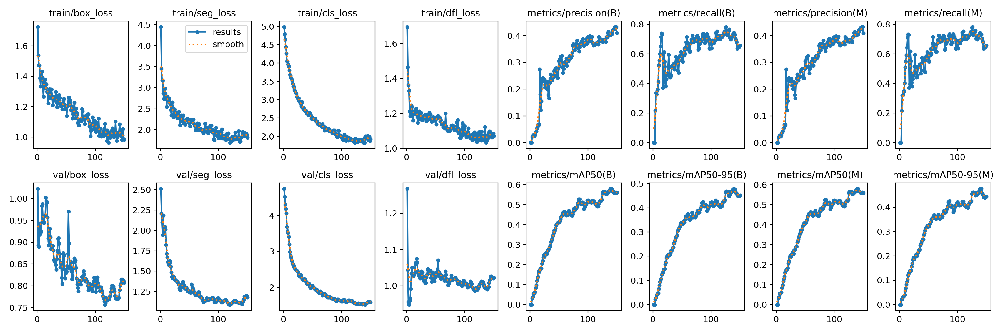

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/Colab Notebooks/ITB_Results/150_epochs-/results.png')

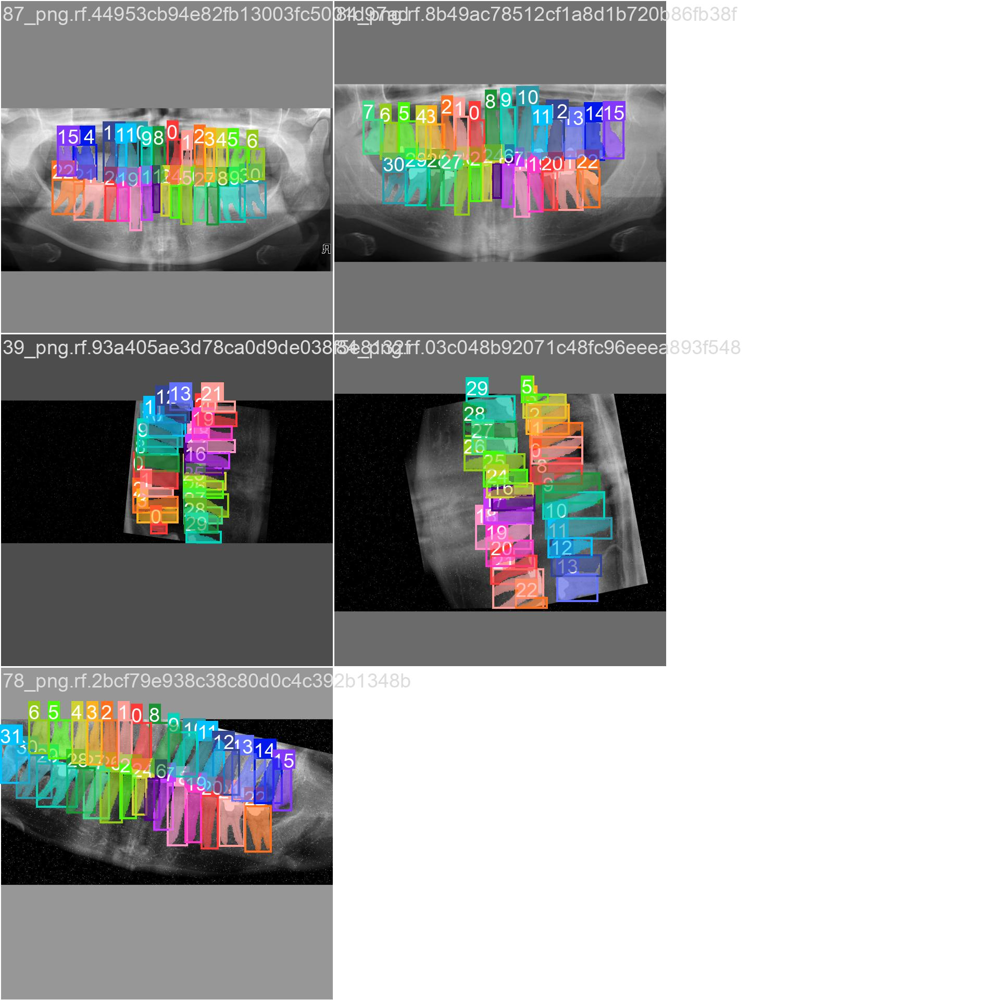

In [ ]:
Image('/content/drive/MyDrive/Colab Notebooks/ITB_Results/150_epochs-/train_batch1962.jpg',width=3000)

In [ ]:

my_new_model = YOLO('/content/drive/MyDrive/Colab Notebooks/ITB_Results/150_epochs-/weights/best.pt')

In [ ]:
new_image = '/content/1.jpg'
new_results = my_new_model.predict(new_image, conf=0.2)  #Adjust conf threshold


image 1/1 /content/1.jpg: 800x1312 1 11, 1 16, 1 18, 2 21s, 4 24s, 3 25s, 1 27, 3 31s, 1 32, 1 33, 2 34s, 2 35s, 1 36, 3 41s, 2 42s, 1 43, 2 44s, 3 45s, 2 46s, 3 47s, 2 48s, 110.0ms
Speed: 10.6ms preprocess, 110.0ms inference, 42.4ms postprocess per image at shape (1, 3, 800, 1312)


In [ ]:
new_image2 = '/content/2.jpg'
new_results2 = my_new_model.predict(new_image2, conf=0.2)  #Adjust conf threshold


image 1/1 /content/2.jpg: 1120x1312 2 11s, 2 12s, 2 13s, 3 14s, 1 15, 1 16, 2 17s, 2 18s, 1 21, 2 22s, 1 23, 1 24, 1 25, 1 26, 2 31s, 1 33, 2 34s, 1 35, 2 41s, 1 42, 2 43s, 2 45s, 2 46s, 4 47s, 2 48s, 287.1ms
Speed: 15.4ms preprocess, 287.1ms inference, 61.8ms postprocess per image at shape (1, 3, 1120, 1312)


In [ ]:
import matplotlib.pyplot as plt


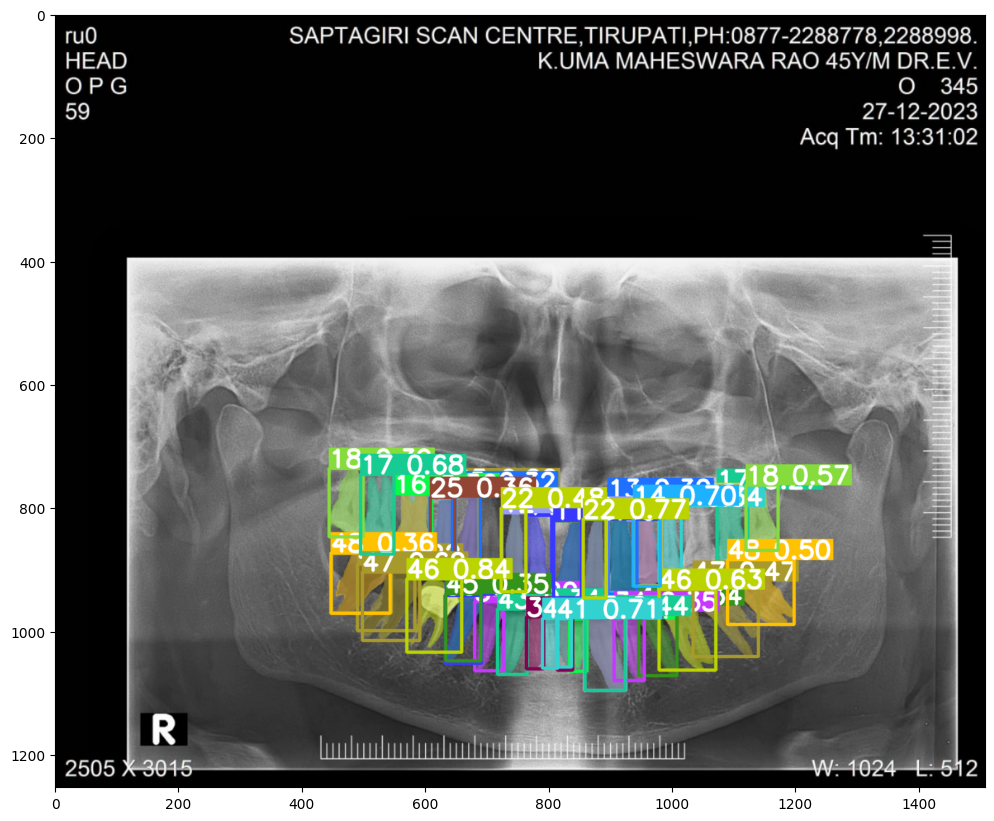

In [ ]:
new_result2_array = new_results2[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result2_array)

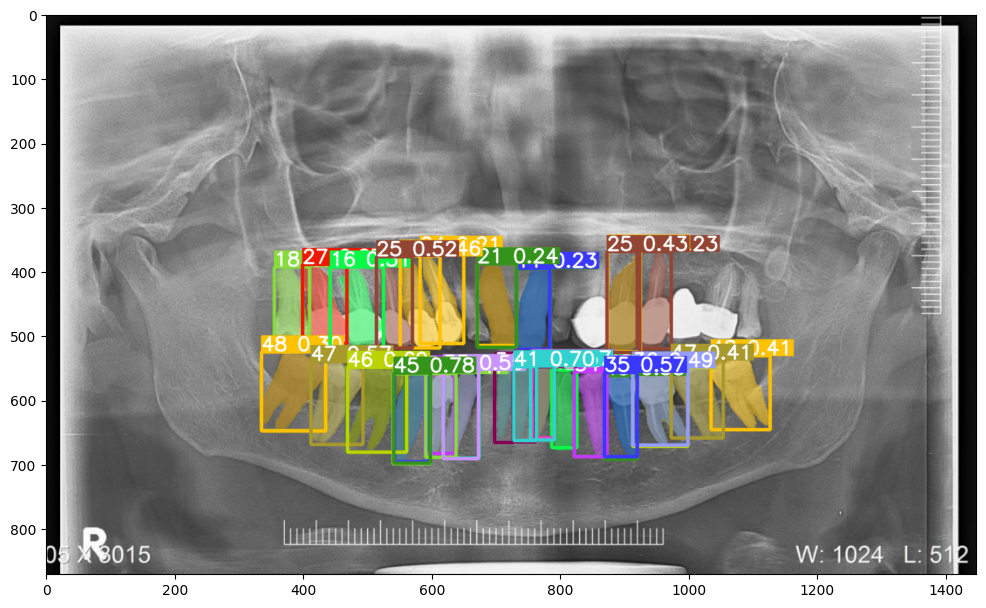

In [ ]:
new_result_array = new_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(new_result_array)

In [ ]:
new_result2 = new_results2[0]
new_result2

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: '11', 1: '12', 2: '13', 3: '14', 4: '15', 5: '16', 6: '17', 7: '18', 8: '21', 9: '22', 10: '23', 11: '24', 12: '25', 13: '26', 14: '27', 15: '28', 16: '31', 17: '32', 18: '33', 19: '34', 20: '35', 21: '36', 22: '37', 23: '38', 24: '41', 25: '42', 26: '43', 27: '44', 28: '45', 29: '46', 30: '47', 31: '48'}
orig_img: array([[[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [2, 2, 2],
        [2, 2, 2],
        [2, 2, 2]],

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [2, 2, 2],
        [2, 2, 2],
        [2, 2, 2]],

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [2, 2, 2],
        [2, 2, 2],
        [2, 2, 2]],

       ...,

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [2, 2, 2],
        [2, 2

In [ ]:
new_result = new_results[0]

In [ ]:
new_result

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: '11', 1: '12', 2: '13', 3: '14', 4: '15', 5: '16', 6: '17', 7: '18', 8: '21', 9: '22', 10: '23', 11: '24', 12: '25', 13: '26', 14: '27', 15: '28', 16: '31', 17: '32', 18: '33', 19: '34', 20: '35', 21: '36', 22: '37', 23: '38', 24: '41', 25: '42', 26: '43', 27: '44', 28: '45', 29: '46', 30: '47', 31: '48'}
orig_img: array([[[22, 22, 22],
        [22, 22, 22],
        [22, 22, 22],
        ...,
        [23, 23, 23],
        [23, 23, 23],
        [23, 23, 23]],

       [[22, 22, 22],
        [22, 22, 22],
        [22, 22, 22],
        ...,
        [23, 23, 23],
        [23, 23, 23],
        [23, 23, 23]],

       [[22, 22, 22],
        [22, 22, 22],
        [22, 22, 22],
        ...,
        [23, 23, 23],
        [23, 23, 23],
        [23, 23, 23]],

       ...,

       [[15, 15, 15],
        [15, 15, 15],
    

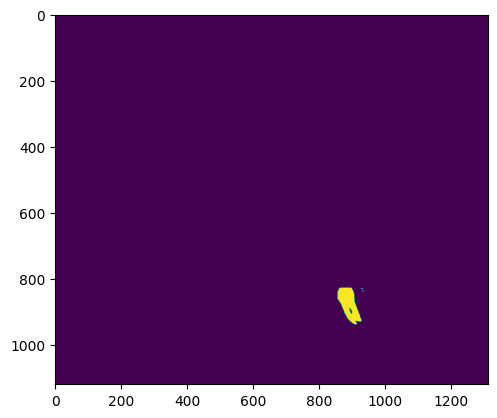

In [ ]:
extracted_masks2 = new_result2.masks.data
extracted_masks2.shape
masks_array2 = extracted_masks2.cpu().numpy()
plt.imshow(masks_array2[6])

In [ ]:
extracted_masks = new_result.masks.data

In [ ]:
extracted_masks.shape

torch.Size([41, 800, 1312])

In [ ]:
masks_array = extracted_masks.cpu().numpy()

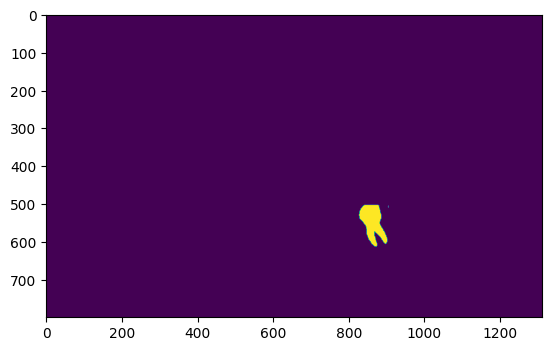

In [ ]:
plt.imshow(masks_array[10])

In [ ]:
class_names2 = new_result2.names.values()
class_names2

dict_values(['11', '12', '13', '14', '15', '16', '17', '18', '21', '22', '23', '24', '25', '26', '27', '28', '31', '32', '33', '34', '35', '36', '37', '38', '41', '42', '43', '44', '45', '46', '47', '48'])

In [ ]:
class_names = new_result.names.values()
class_names

dict_values(['11', '12', '13', '14', '15', '16', '17', '18', '21', '22', '23', '24', '25', '26', '27', '28', '31', '32', '33', '34', '35', '36', '37', '38', '41', '42', '43', '44', '45', '46', '47', '48'])

In [ ]:
# Extract the boxes, which likely contain class IDs
detected_boxes2 = new_result2.boxes.data
# Extract class IDs from the detected boxes
class_labels2 = detected_boxes2[:, -1].int().tolist()
# Initialize a dictionary to hold masks by class
masks_by_class2 = {name: [] for name in new_result2.names.values()}

# Iterate through the masks and class labels
for mask, class_id in zip(extracted_masks2, class_labels2):
    class_name = new_result2.names[class_id]  # Map class ID to class name
    masks_by_class2[class_name].append(mask.cpu().numpy())

In [ ]:
# Extract the boxes, which likely contain class IDs
detected_boxes = new_result.boxes.data
# Extract class IDs from the detected boxes
class_labels = detected_boxes[:, -1].int().tolist()
# Initialize a dictionary to hold masks by class
masks_by_class = {name: [] for name in new_result.names.values()}

# Iterate through the masks and class labels
for mask, class_id in zip(extracted_masks, class_labels):
    class_name = new_result.names[class_id]  # Map class ID to class name
    masks_by_class[class_name].append(mask.cpu().numpy())


In [ ]:
for class_name, masks in masks_by_class2.items():
    print(f"Class Name: {class_name}, Number of Masks: {len(masks)}")

Class Name: 11, Number of Masks: 2
Class Name: 12, Number of Masks: 2
Class Name: 13, Number of Masks: 2
Class Name: 14, Number of Masks: 3
Class Name: 15, Number of Masks: 1
Class Name: 16, Number of Masks: 1
Class Name: 17, Number of Masks: 2
Class Name: 18, Number of Masks: 2
Class Name: 21, Number of Masks: 1
Class Name: 22, Number of Masks: 2
Class Name: 23, Number of Masks: 1
Class Name: 24, Number of Masks: 1
Class Name: 25, Number of Masks: 1
Class Name: 26, Number of Masks: 1
Class Name: 27, Number of Masks: 0
Class Name: 28, Number of Masks: 0
Class Name: 31, Number of Masks: 2
Class Name: 32, Number of Masks: 0
Class Name: 33, Number of Masks: 1
Class Name: 34, Number of Masks: 2
Class Name: 35, Number of Masks: 1
Class Name: 36, Number of Masks: 0
Class Name: 37, Number of Masks: 0
Class Name: 38, Number of Masks: 0
Class Name: 41, Number of Masks: 2
Class Name: 42, Number of Masks: 1
Class Name: 43, Number of Masks: 2
Class Name: 44, Number of Masks: 0
Class Name: 45, Numb

In [ ]:
for class_name, masks in masks_by_class.items():
    print(f"Class Name: {class_name}, Number of Masks: {len(masks)}")


Class Name: 11, Number of Masks: 1
Class Name: 12, Number of Masks: 0
Class Name: 13, Number of Masks: 0
Class Name: 14, Number of Masks: 0
Class Name: 15, Number of Masks: 0
Class Name: 16, Number of Masks: 1
Class Name: 17, Number of Masks: 0
Class Name: 18, Number of Masks: 1
Class Name: 21, Number of Masks: 2
Class Name: 22, Number of Masks: 0
Class Name: 23, Number of Masks: 0
Class Name: 24, Number of Masks: 4
Class Name: 25, Number of Masks: 3
Class Name: 26, Number of Masks: 0
Class Name: 27, Number of Masks: 1
Class Name: 28, Number of Masks: 0
Class Name: 31, Number of Masks: 3
Class Name: 32, Number of Masks: 1
Class Name: 33, Number of Masks: 1
Class Name: 34, Number of Masks: 2
Class Name: 35, Number of Masks: 2
Class Name: 36, Number of Masks: 1
Class Name: 37, Number of Masks: 0
Class Name: 38, Number of Masks: 0
Class Name: 41, Number of Masks: 3
Class Name: 42, Number of Masks: 2
Class Name: 43, Number of Masks: 1
Class Name: 44, Number of Masks: 2
Class Name: 45, Numb

In [ ]:
maximal_molar_left_masks2 = masks_by_class2['47']
maximal_molar_left_3rd_masks2 = masks_by_class2['46']

In [ ]:
maximal_molar_left_masks = masks_by_class['47']
maximal_molar_left_3rd_masks = masks_by_class['46']

In [ ]:
# Extract the original image
orig_img2 = new_result2.orig_img
print(orig_img2.shape)

(1253, 1508, 3)


In [ ]:
# Extract the original image
orig_img = new_result.orig_img
print(orig_img.shape)

(871, 1448, 3)


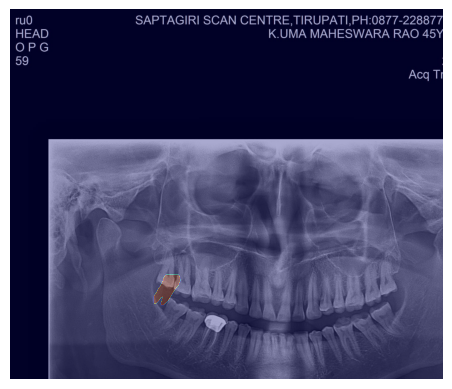

In [ ]:
# Display the original image
plt.imshow(orig_img2, cmap='gray')

# Overlay the mask with some transparency
#plt.imshow(alpha_granule_masks[1], cmap='jet', alpha=0.3)
plt.imshow(maximal_molar_left_masks2[0], cmap='jet', alpha=0.3)
plt.axis('off') # Turn off axis labels
plt.show()

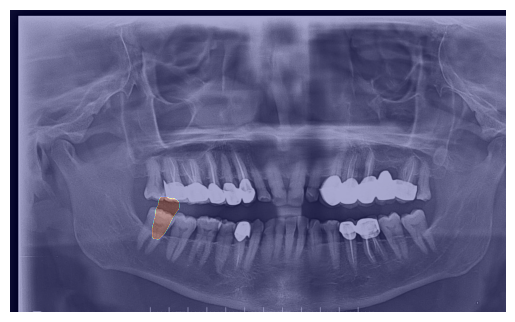

In [ ]:
# Display the original image
plt.imshow(orig_img, cmap='gray')

# Overlay the mask with some transparency
#plt.imshow(alpha_granule_masks[1], cmap='jet', alpha=0.3)
plt.imshow(maximal_molar_left_masks[0], cmap='jet', alpha=0.3)
plt.axis('off') # Turn off axis labels
plt.show()

In [ ]:
import pandas as pd
from skimage.measure import regionprops

# Initialize a list to store the properties
props_list = []

# Iterate through all classes
for class_name, masks in masks_by_class.items():
    # Iterate through the masks for this class
    for mask in masks:
        # Convert the mask to an integer type if it's not already
        mask = mask.astype(int)

        # Apply regionprops to the mask
        props = regionprops(mask)

        # Extract the properties you want (e.g., area, perimeter) and add them to the list
        for prop in props:
            area = prop.area
            perimeter = prop.perimeter
            # Add other properties as needed

            # Append the properties and class name to the list
            props_list.append({'Class Name': class_name, 'Area': area, 'Perimeter': perimeter})

# Convert the list of dictionaries to a DataFrame
props_df = pd.DataFrame(props_list)

# Now props_df contains the properties and class names for all regions

# Save the DataFrame to a CSV file
props_df.to_csv('/content/drive/MyDrive/Colab Notebooks/ITB_Results/YOLOv8_object_properties.csv', index=False)


In [ ]:
props_df

,Class Name,Area,Perimeter
0,11,4203,293.053824
1,16,4070,295.722871
2,18,3776,272.124892
3,21,4111,297.781746
4,21,4100,285.639610
5,24,4191,312.308658
6,24,4468,327.030483
7,24,3776,312.693434
8,24,4120,298.610173
9,25,3690,312.994949


In [ ]:
import seaborn as sns

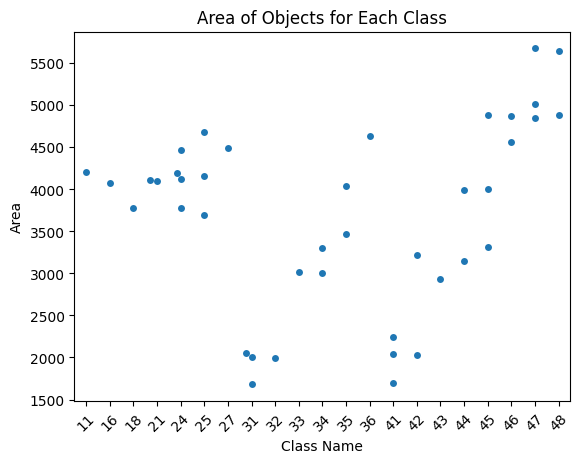

In [ ]:
# Create the swarm plot with Seaborn
sns.swarmplot(x='Class Name', y='Area', data=props_df)

# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

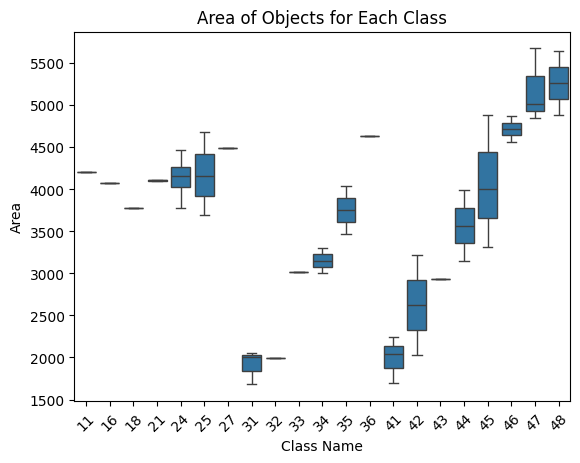

In [ ]:
sns.boxplot(x='Class Name', y='Area', data=props_df)
# Add labels and a title
plt.xlabel('Class Name')
plt.ylabel('Area')
plt.title('Area of Objects for Each Class')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()